In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import deepcopy

In [2]:
image_path = '0040.jpg'
# image_path = '/Users/yagmurozdemir/Desktop/0040.jpg'
img = Image.open(image_path)

In [3]:
img_gray = img.convert('L')

In [4]:
np.array(img_gray.getdata()).reshape(512,512).flatten()

array([157, 144, 134, ..., 137, 143, 181])

In [5]:
# np.array(img.getdata()).reshape((3, 512, 512))

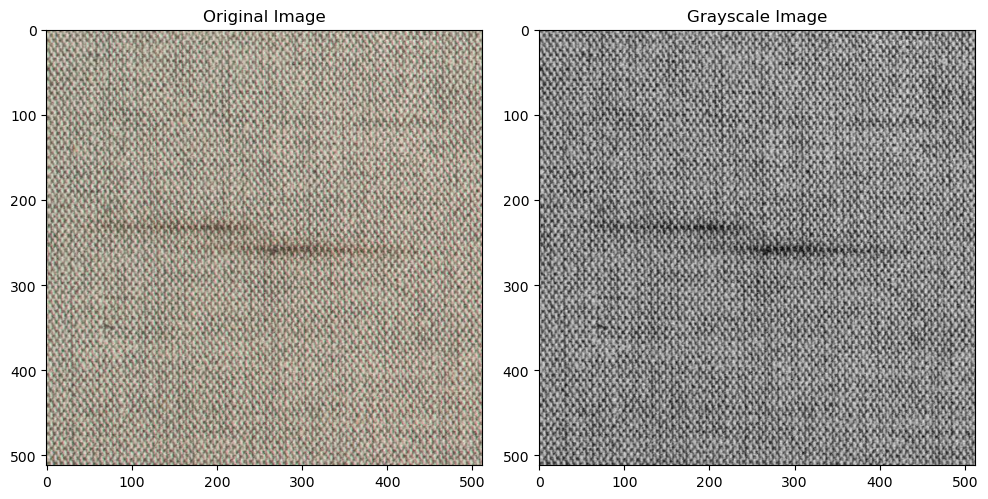

In [6]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')

plt.tight_layout()
plt.show()

In [7]:
pixels = np.array(img_gray.getdata())
pixels = pixels.reshape((512,512))

In [8]:
pixels

array([[157, 144, 134, ..., 125, 123, 112],
       [110,  95, 110, ..., 105, 114, 127],
       [121, 108, 123, ..., 138, 133, 133],
       ...,
       [159,  98, 100, ..., 119, 145, 170],
       [155,  97, 117, ..., 149, 146, 167],
       [166, 112, 139, ..., 137, 143, 181]])

# A Baseline Defect Detection Approach from a Statistical Data Analysis Perspective

Basic statistics for the image

In [9]:
mean, std = np.mean(pixels), np.std(pixels)
print(mean, std)

min_val, max_val = np.min(pixels), np.max(pixels)
print(min_val, max_val)

155.81078338623047 33.26710680985599
56 249


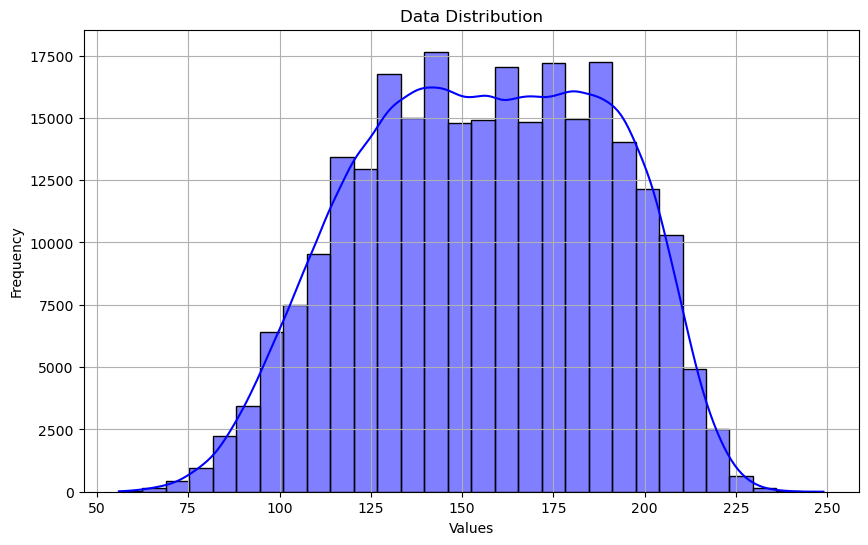

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, skewnorm

data_values = pixels.reshape(-1).tolist()

# plot the distribution
plt.figure(figsize=(10, 6))
sns.histplot(data_values, kde=True, bins=30, color='blue')
plt.title('Data Distribution')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

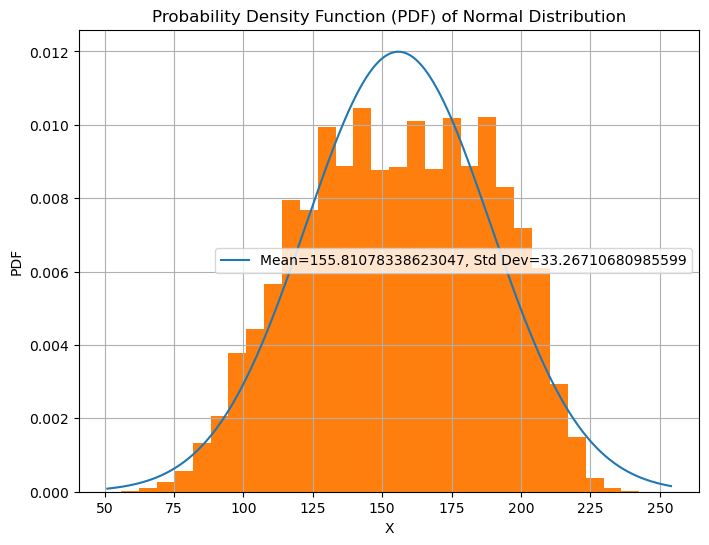

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Generate a range of x values
x = np.linspace(min_val-5, max_val+5, 1000)

# Calculate the PDF for each x value using the normal distribution
pdf = norm.pdf(x, loc=mean, scale=std)

# Plot the PDF
plt.figure(figsize=(8, 6))
plt.plot(x, pdf, label=f'Mean={mean}, Std Dev={std}')
plt.hist(pixels.reshape(-1).tolist(), density=True, bins=30)
plt.title('Probability Density Function (PDF) of Normal Distribution')
plt.xlabel('X')
plt.ylabel('PDF')
plt.legend()
plt.grid(True)
plt.show()


In [12]:
from scipy.stats import chisquare, norm
import numpy as np

# Sample data
data = pixels.reshape(-1).tolist()

# Create a histogram of the data with equal probability bins
num_bins = 30
percentiles = np.linspace(0, 100, num_bins + 1)
bin_edges = norm.ppf(percentiles / 100.0, mean, std)
hist, _ = np.histogram(data, bins=bin_edges)

# The expected frequency in each bin, if the data follows the specified normal distribution
expected_freq = len(data) / num_bins

# Apply the chi-square goodness of fit test
chi2_stat, p_value = chisquare(hist, np.full(num_bins, expected_freq))

chi2_stat, p_value

(18774.969345092773, 0.0)

The data seem to be distributed normally. However, when we applied a chi-square test, the hypotesis that they are normally distributed is rejected for any (confidence level, since the p value is almost 0). Yet, we assume that the distribution is normal with the estimated parameters, as we could not find a better distribution candidate -the histogram resembles to normal distribution the most. 

In [13]:
#q1.3

In [14]:
import scipy.stats as stats

alpha = 0.001
lb, ub = stats.norm.ppf(alpha, loc=mean, scale=std), stats.norm.ppf(1-alpha, loc=mean, scale=std)
lb, ub

(53.00769518967823, 258.61387158278274)

In [15]:
min_val, max_val

(56, 249)

As the lower and upper bounds for alpha = 0.001 leave no pixel out of bounds, we try to set alpha to 0.005 instead and the corresponding bounds leave some of the pixels out of bounds.

In [16]:
import scipy.stats as stats

alpha = 0.005
lb, ub = stats.norm.ppf(alpha, loc=mean, scale=std), stats.norm.ppf(1-alpha, loc=mean, scale=std)
lb, ub

(70.12039482111223, 241.50117195134868)

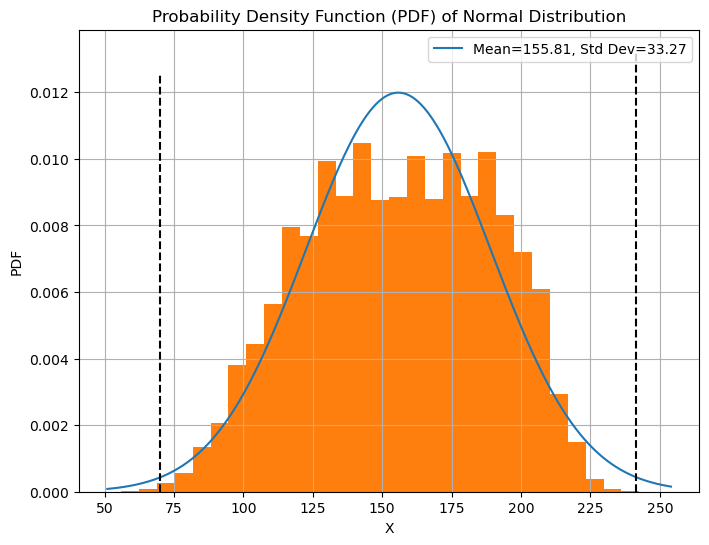

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Generate a range of x values
x = np.linspace(min_val-5, max_val+5, 1000)

# Calculate the PDF for each x value using the normal distribution
pdf = norm.pdf(x, loc=mean, scale=std)

# Plot the PDF
plt.figure(figsize=(8, 6))
plt.plot(x, pdf, label=f'Mean={np.round(mean,2)}, Std Dev={np.round(std,2)}')
plt.hist(pixels.reshape(-1).tolist(), density=True, bins=30)

plt.vlines(lb, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='black')
plt.vlines(ub, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='black')

plt.title('Probability Density Function (PDF) of Normal Distribution')
plt.xlabel('X')
plt.ylabel('PDF')
plt.legend()
plt.grid(True)
plt.show()


In [18]:
pixels[pixels<lb]

array([70, 70, 60, 69, 65, 66, 65, 62, 67, 69, 68, 62, 66, 68, 70, 70, 70,
       66, 66, 57, 60, 60, 67, 60, 69, 63, 68, 69, 69, 68, 68, 70, 67, 66,
       65, 63, 68, 65, 68, 68, 68, 67, 65, 69, 68, 62, 69, 59, 65, 69, 68,
       69, 68, 69, 67, 69, 68, 70, 69, 66, 67, 67, 63, 68, 70, 70, 68, 68,
       67, 61, 69, 68, 64, 62, 67, 63, 68, 66, 62, 70, 65, 68, 70, 59, 65,
       65, 66, 68, 66, 69, 66, 59, 67, 69, 62, 64, 66, 67, 59, 68, 68, 64,
       65, 64, 69, 60, 62, 65, 67, 64, 60, 66, 70, 65, 62, 63, 68, 69, 70,
       62, 68, 68, 68, 70, 65, 65, 62, 64, 58, 67, 69, 68, 68, 70, 70, 64,
       66, 59, 57, 63, 66, 68, 69, 65, 66, 57, 66, 63, 63, 65, 66, 63, 63,
       67, 70, 70, 65, 68, 70, 70, 68, 70, 70, 68, 68, 62, 69, 67, 68, 66,
       69, 70, 64, 68, 65, 60, 65, 69, 67, 70, 59, 68, 68, 69, 70, 65, 60,
       60, 69, 70, 67, 62, 65, 70, 68, 69, 68, 70, 62, 66, 66, 67, 68, 58,
       69, 63, 65, 62, 67, 62, 67, 61, 66, 68, 68, 70, 64, 70, 70, 70, 68,
       65, 65, 62, 70, 70

In [19]:
pixels[pixels>ub]

array([249, 243])

In [20]:
mask = (pixels<lb) | (pixels>ub)
# pixels_marked = np.array(img.convert('L').getdata()).reshape((512,512))
pixels_marked = deepcopy(pixels)
pixels_marked[mask] = 0

In [21]:
mask.sum()

276

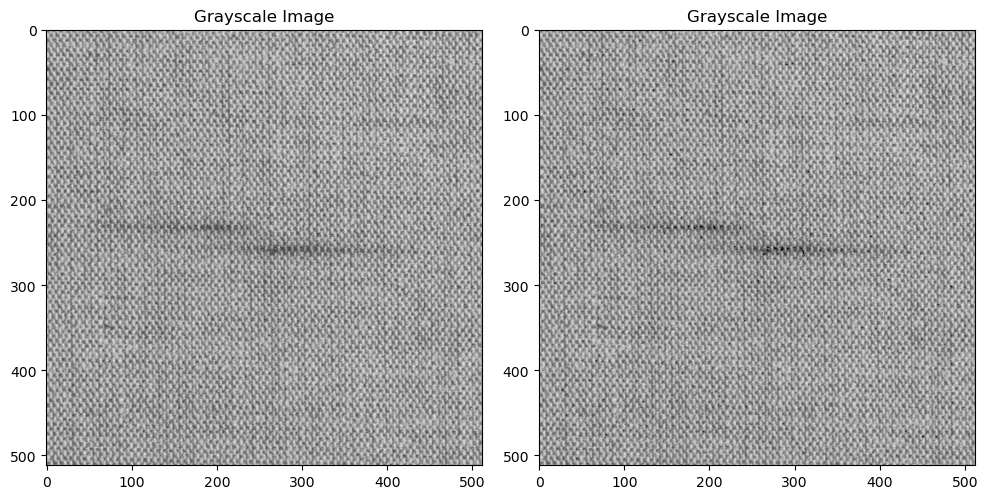

In [22]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(pixels_marked, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.tight_layout()
plt.show()

The out-of-bounds pixels are distributed across the image, therefore the difference between the original image and the filtered one cannot be seen clearly. To see the defect predictions more clearly, we change the color of in-bounds pixels to white, in addition to changing the out-of-bounds ones to black. This approach will be employed throghout the work.

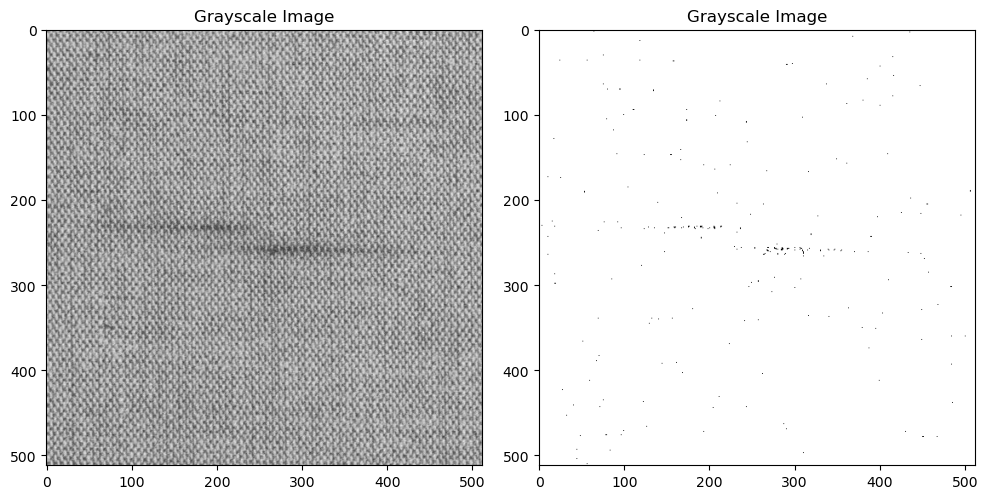

In [23]:
pixels_marked = deepcopy(pixels)
pixels_marked[mask] = 0
pixels_marked[~mask] = 255

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(pixels_marked, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.tight_layout()
plt.show()

It seems that the first method was able to detect the defects to some extent, assuming that the defects on this linen are the two horizontal lines at the center of the image. However, it also misclassified some okay pixels as defective.

Let us now apply a similar approach with patches. The number of patch operations can be found as below, using the formula for the number of convolution operations:

(W−K+2P)/S)+1, where W, K, P and S are width (height), kernel size (patch size in our case), padding (0 in our case), and stride (1 in our case, as we do not jump between two convolution operations) respectively.

In [24]:
# [(W−K+2P)/S]+1
(512-51+1)**2

213444

In [25]:
from tqdm import tqdm

In [26]:
patch_size = 51
height, width = pixels.shape

# find the number of rows and columns to iterate through
num_rows_to_iterate = height - patch_size + 1
num_cols_to_iterate = width - patch_size + 1

# initialize the mask
mask2 = np.zeros((height, width))

for i in tqdm(range(num_rows_to_iterate)):
    for j in range(num_cols_to_iterate):
        # extract the corresponding region from the input image
        patch = pixels[i:i + patch_size, j:j + patch_size]
        
        # estimate patch parameters
        patch_mean, patch_std = patch.mean(), patch.std()
        
        # based on the estimated parameters, determine the bounds
        patch_lb = stats.norm.ppf(alpha, loc=patch_mean, scale=patch_std)
        patch_ub = stats.norm.ppf(1-alpha, loc=patch_mean, scale=patch_std)
        
        # obtain the mask for patch
        patch_mask = (patch<patch_lb) | (patch>patch_ub)
        
        # update the overall mask
        mask2[i:i + patch_size, j:j + patch_size] += patch_mask
        
# if a pixel is marked as out-of-bounds at least for one patch
# mark it on the overall mask as well
mask2 = np.where(mask2>0, 1, 0)

100%|████████████████████████████████████████████████████████████████████████████████| 462/462 [01:11<00:00,  6.47it/s]


In [27]:
print('number of out-of-bounds pixels:', mask2.sum())

number of out-of-bounds pixels: 556


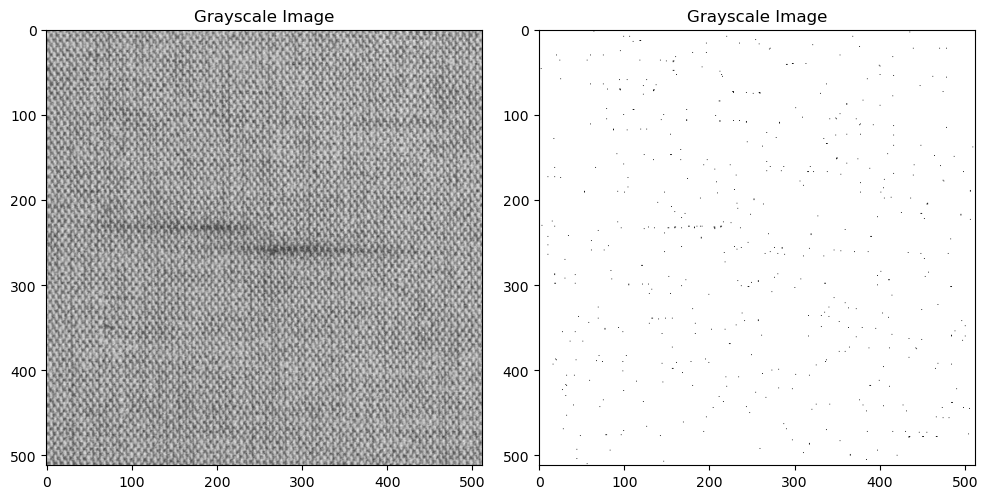

In [28]:
pixels_marked2 = np.where(mask2, 0, 255)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(pixels_marked2, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')
plt.tight_layout()
plt.show()

The performance seems to got worse when we apply the previous method with patches. The problem of misclassification of non-problematic pixels as defective is more serious and the ability of detecting the defects is lost.

# A Simple Defect Detection Approach from a Control Chart Perspective

In [29]:
# for rows

height, width = pixels.shape

mask3 = np.zeros((height, width))

for i in tqdm(range(height)):
    # extract the corresponding region from the input image
    row = pixels[i,:]
    
    # estimate the parameters for the row
    row_mean, row_std = row.mean(), row.std()
    
    # determine the bounds
    row_lb = stats.norm.ppf(alpha, loc=row_mean, scale=row_std)
    row_ub = stats.norm.ppf(1-alpha, loc=row_mean, scale=row_std)
    
    # obtain the mask for row and update the overall mask accordingly
    row_mask = (row<row_lb) | (row>row_ub)
    mask3[i,:] += row_mask
    
# if a pixel is marked as out-of-bounds at least for one row
# mark it on the overall mask as well
mask3 = np.where(mask3>0, 1, 0)

100%|██████████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 2823.54it/s]


In [30]:
print('number of out-of-bounds pixels:', mask3.sum())

number of out-of-bounds pixels: 199


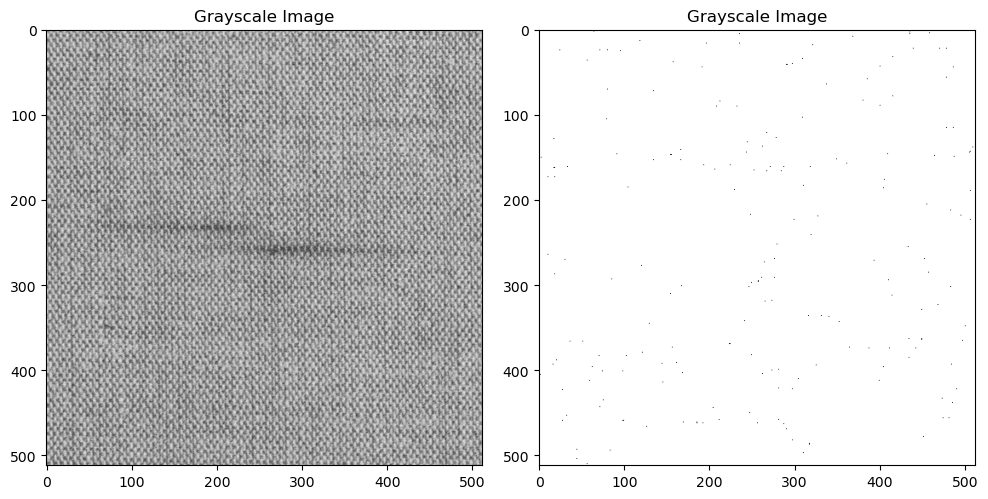

In [31]:
pixels_marked3 = np.where(mask3, 0, 255)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(pixels_marked3, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')
plt.tight_layout()
plt.show()

In [32]:
# for columns

height, width = pixels.shape

mask4 = np.zeros((height, width))

for j in tqdm(range(width)):
    # Extract the corresponding region from the input image
    column = pixels[:,j]

    # estimate the parameters for the column
    column_mean, column_std = column.mean(), column.std()

     # determine the bounds
    column_lb = stats.norm.ppf(alpha, loc=column_mean, scale=column_std)
    column_ub = stats.norm.ppf(1-alpha, loc=column_mean, scale=column_std)
    
    # obtain the mask for row and update the overall mask accordingly
    column_mask = (column<column_lb) | (column>column_ub)
    mask4[:,j] += column_mask
    
mask4 = np.where(mask4>0, 1, 0)

100%|██████████████████████████████████████████████████████████████████████████████| 512/512 [00:00<00:00, 2896.16it/s]


In [33]:
print('number of out-of-bounds pixels:', mask4.sum())

number of out-of-bounds pixels: 387


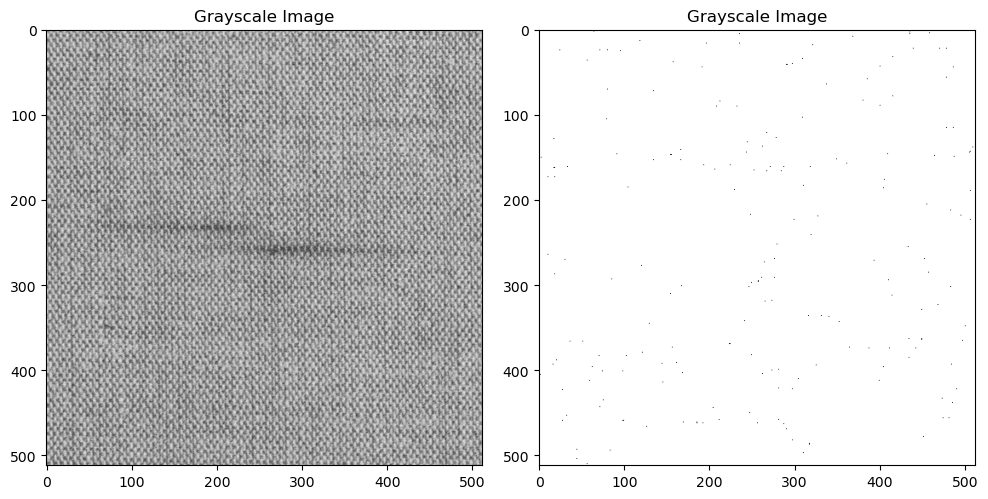

In [34]:
pixels_marked4 = np.where(mask3, 0, 255)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(pixels_marked4, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale Image')
plt.tight_layout()
plt.show()

Both methods seem to performed poorly. It would be interesting to see differences in recognitions of horizontal and vertical patterns for the rowwise and columnwise methods but unfortunately, there is no clear relation of such. Out-of-bounds pixels seem to be distributed in a similar -and random- way for both methods. One thing to note is that the columnwise method gave more out-of-bounds pixels. As approximately all of the out-of-bounds pixels seems to be okay in reality, it may be said that both methods performed poorly but the columnwise method performed even worse.

# Our Proposal: PCA

In [35]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np


image_path = "0040.jpg"  
# image_path = '/Users/yagmurozdemir/Desktop/0040.jpg'

# Function to load and convert a single image to grayscale and resize to 512x512
def load_and_gray_image(image_path):
    image = Image.open(image_path)
    image_gray = image.convert('L')
    image_gray_resized = image_gray.resize((512, 512), Image.ANTIALIAS)
    return np.array(image_gray_resized)

# Load the specific image
image_gray = load_and_gray_image(image_path)

# Normalize the image data to 0-1 range
image_data = image_gray / 255.0

# Flatten the image to a 1D array for PCA
flattened_image = image_data.flatten()

# Perform PCA on the flattened image
# Choose enough components to cover a significant amount of variance
pca = PCA(n_components=0.95)
pca.fit([flattened_image])

# Print the number of components and the explained variance
num_components = pca.n_components_
explained_variance = pca.explained_variance_ratio_.sum()
print(f"Number of PCA components: {num_components}")
print(f"Total explained variance: {explained_variance}")



Number of PCA components: 1
Total explained variance: nan


C:\Users\Excalibur\AppData\Local\Temp\ipykernel_9812\3520703647.py:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  image_gray_resized = image_gray.resize((512, 512), Image.ANTIALIAS)
C:\Users\Excalibur\anaconda3\lib\site-packages\sklearn\decomposition\_pca.py:499: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ = (S ** 2) / (n_samples - 1)


C:\Users\Excalibur\AppData\Local\Temp\ipykernel_9812\3061922994.py:13: RuntimeWarning: invalid value encountered in true_divide
  residual_scaled = residual / residual.max()


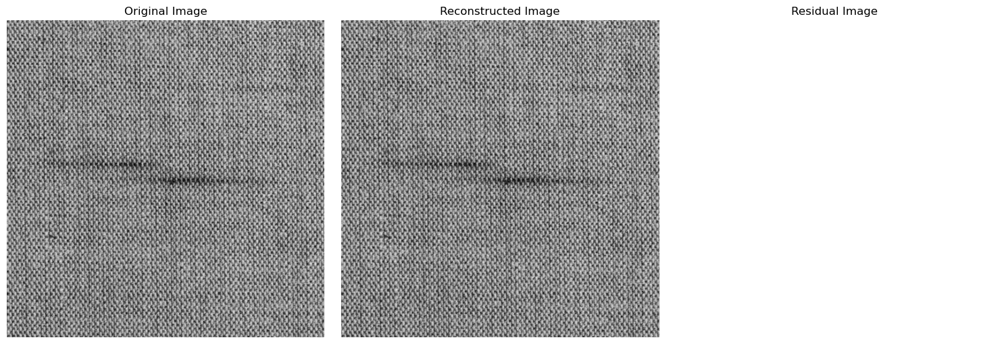

In [36]:
# Transform the flattened image to the PCA space and then reconstruct it
pca_transformed_image = pca.transform([flattened_image])
reconstructed_image = pca.inverse_transform(pca_transformed_image)[0]

# Reshape the reconstructed image to its original 2D shape (512x512)
reconstructed_image_2D = reconstructed_image.reshape((512, 512))

# Calculate the residual
residual = np.abs(image_data - reconstructed_image_2D)

# Enhance the contrast of the residuals
# Scale residuals to the range 0-1 for visualization purposes
residual_scaled = residual / residual.max()

# Display the original, reconstructed, and residual images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_gray, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Reconstructed image
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image_2D * 255, cmap='gray')  # Rescale back to 0-255 for display
plt.title('Reconstructed Image')
plt.axis('off')

# Residual image with enhanced contrast
plt.subplot(1, 3, 3)
plt.imshow(residual_scaled, cmap='hot')  # Use a colormap that highlights the differences
plt.title('Residual Image')
plt.axis('off')

plt.tight_layout()
plt.show()


The issue we're encountering, where the total explained variance is nan and the number of PCA components is 1, suggests that the PCA is not being performed correctly. The likely cause is that PCA is being run on a single flattened image as a 1D array, which does not provide multiple samples for PCA to work with.

PCA is designed to work on a dataset with multiple observations (in this case, images or patches of images) from which it can extract components. When you provide PCA with a single observation (as is the case with one flattened image), it will not be able to compute the covariance matrix properly, which is why it is giving nan for the explained variance.

To fix this, we need to make sure that PCA is provided with multiple observations. As we only have one image to work with, one common approach is to divide the image into smaller patches and treat each patch as a separate observation **(Alternatively, we could have used all the available images to fit the PCA)**. Below, you can see our modified approach to solve this problem. One possible shortcoming of the below method is that if the defects span through the linen -defective pixels are in a sense close to being the "norm"-, PCA would try to model and reconstruct them so the method would fail. Therefore, the larger the defects the worse the performance in general. 

In [56]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def extract_patches(image, patch_size):
    patches = []
    for i in range(0, image.shape[0], patch_size):
        for j in range(0, image.shape[1], patch_size):
            patch = image[i:i+patch_size, j:j+patch_size]
            if patch.shape == (patch_size, patch_size):
                patches.append(patch.flatten())
    return patches

image_path = "0040.jpg"  
# image_path = '/Users/yagmurozdemir/Desktop/0040.jpg'
image = Image.open(image_path).convert('L')
image_resized = image.resize((512, 512))
image_data = np.array(image_resized)

# Extract patches from the image
patch_size = 32  # This is an arbitrary patch size, can be adjusted
patches = extract_patches(image_data, patch_size)

# Perform PCA on the patches
pca = PCA(0.4)
pca.fit(patches)

# Explained variance
explained_variance = pca.explained_variance_ratio_.sum()
print(f"Total explained variance: {explained_variance}")

# Now reconstruct the image using the PCA components
reconstructed_patches = pca.inverse_transform(pca.transform(patches))

# Reconstruct the original image from the patches
reconstructed_image = np.zeros_like(image_data, dtype=np.float64)
for idx, patch in enumerate(reconstructed_patches):
    i = (idx // (512 // patch_size)) * patch_size
    j = (idx % (512 // patch_size)) * patch_size
    reconstructed_image[i:i+patch_size, j:j+patch_size] = patch.reshape(patch_size, patch_size)



Total explained variance: 0.4343189032421882


Residuals: min=0.00011705450080512492, max=111.58968372823219, mean=20.136099516147432


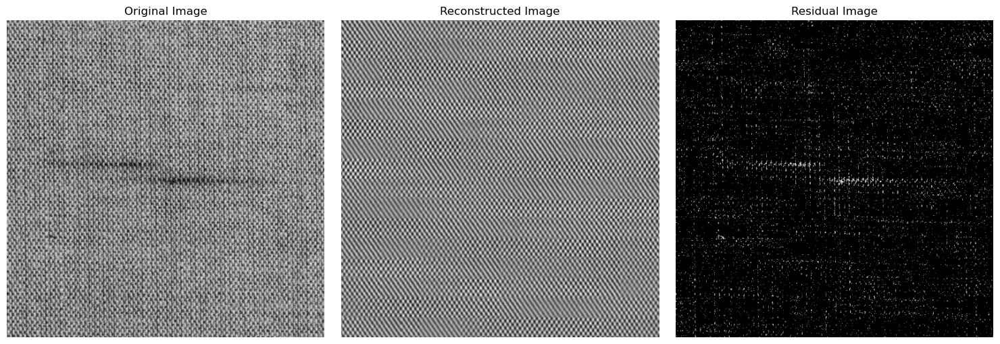

In [57]:

# Calculate residuals
residuals = np.abs(image_data - reconstructed_image)

# Check the range of residual values
print(f"Residuals: min={residuals.min()}, max={residuals.max()}, mean={residuals.mean()}")

# Adjust the scaling based on the range of residuals
# For example, only visualize residuals above a certain threshold
threshold_value = np.percentile(residuals, 95)  # Keep the top 5% of residuals
residuals_thresholded = np.where(residuals > threshold_value, residuals, 0)

# Rescale the thresholded residuals to be in the range [0, 255]
residuals_scaled = 255 * (residuals_thresholded / residuals_thresholded.max())



# Display the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_data, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Reconstructed image
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

# Residual image
plt.subplot(1, 3, 3)
plt.imshow(residuals_scaled, cmap='gray')
plt.title('Residual Image')
plt.axis('off')

plt.tight_layout()
plt.show()


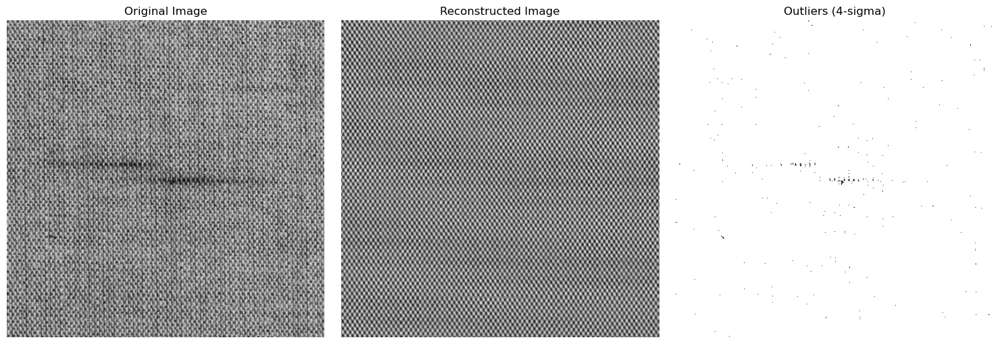

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'residuals' is already computed as the absolute difference 
# between the original and the reconstructed images.

# Calculate the mean and standard deviation
residuals_mean = residuals.mean()
residuals_std = residuals.std()

# Calculate control limits
k = 4
UCL = residuals_mean + k * residuals_std
LCL = residuals_mean - k * residuals_std

# Identify outliers
outliers = np.where((residuals > UCL) | (residuals < LCL), 0, 255)

# # Scale the outliers for better visualization
# outliers_scaled = 255 * (outliers / outliers.max())

# Display the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_data, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Reconstructed image
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

# Outlier image (residuals that are considered outliers)
plt.subplot(1, 3, 3)
# plt.imshow(outliers_scaled, cmap='gray')
plt.imshow(outliers, cmap='gray')
plt.title(f'Outliers ({k}-sigma)')
plt.axis('off')

plt.tight_layout()
plt.show()


#PCA Approach for Outlier Detection
Our objective was to identify potential defects in textile images using a PCA-based approach. The process involved the following steps:

1. Image Preparation: We started by loading the grayscale image and resizing it to a uniform 512x512 pixel format. This standardization was crucial for consistent patch extraction and subsequent analysis.

2. Patch Extraction: The image was divided into smaller, non-overlapping patches of size 32x32 pixels. Each patch was treated as an independent data point for PCA, allowing us to capture localized features and variations within the image.

3. PCA Application: We applied PCA to the flattened patches with the goal of retaining 95% of the variance. This step reduced the dimensionality of the data while preserving the most critical features, which are indicative of the underlying structure and possible anomalies.

4. Image Reconstruction: Using the principal components obtained from PCA, we reconstructed the image from the patches. This helped us generate a version of the image that maintained the primary characteristics while potentially omitting minor details and noise.

5. Residual Calculation: By calculating the absolute difference between the original and the reconstructed images, we obtained a residual image. The residuals represent the variations that were not captured by the PCA model, which could include defects.

6. Control Chart Construction: We employed a control chart with 3-sigma rules to the residuals. This statistical process control method allowed us to establish a threshold for detecting outliers. Residuals that fell outside of three standard deviations from the mean were flagged as potential defects.

7. Visualization: Finally, we visualized the original, reconstructed, and residual images. The residual image emphasized areas with significant deviations, which, after applying the 3-sigma rule, highlighted the outliers that could correspond to defects in the textile material.

Through this approach, we leveraged PCA not just as a dimensionality reduction technique but as a means of feature extraction and anomaly detection. The control chart added a layer of statistical rigor to objectively identify outliers, streamlining the quality control process for the textile industry.







# Our Proposal: K-nearest Neighboors

In [40]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


image = Image.open(image_path).convert('L')
image_resized = image.resize((512, 512))
image_data = np.array(image_resized)

# Flatten the image to create a dataset where each row is a pixel and the column is the grayscale intensity
X = np.indices((512, 512)).reshape(2, -1).T
y = image_data.flatten()

# Create a KNN model and use grid search to find the optimum 'k'
params = {'n_neighbors': range(1, 10)}
knn = KNeighborsRegressor()
grid_search = GridSearchCV(knn, params)
grid_search.fit(X, y)

# Optimum 'k'
optimum_k = grid_search.best_params_['n_neighbors']
print(f"Optimum k: {optimum_k}")

# Create a KNN model with the optimum 'k'
knn_opt = KNeighborsRegressor(n_neighbors=optimum_k)
knn_opt.fit(X, y)

# Predict the pixel values
y_pred = knn_opt.predict(X)

# Reshape the predicted values to an image
reconstructed_image = y_pred.reshape(512, 512)

# Calculate residuals
residuals = np.abs(image_data - reconstructed_image)



Optimum k: 8


It should be noted that what we are optimizing here is the predictive ability of the KNN model not for the defects in linen but for the linen itself. That is, the best model that reconstructs the image (the pixel matrix) is chosen, not the one that classifies the defects the best. This is because the data we have is unlabeled, we do not have a quantitive way to measure the defect detection quality. Another issue is that the thing we are optimizing here may not be fully transferable to the actual case -i.e. defect detection. A model that is optimized to reconstruct the images may perfectly reconstruct the defects as well but this is indeed the opposite of what we seek to achieve. We need models that can reconstruct the general patterns in the images and fail to reconstruct the anomalies -which are linen defects in this case. To elaborate this point further, consider the possible number of pixels a defect could reside at. If the defect is on more than one pixel, which is quite probable, the KNN model with k=8 would likely to be able to reconstruct the defect because the mean of the pixel values at which the defect resides would be close to each other and the pixel to predict. In short, the possible shortcoming of overfitting of the "reconstructive models" approach -especially KNN- should be noted. This may be the reason behind some of the poor defect detection performances below. 

One additional shortcoming of the KNN approach is that the predictions for the pixels on the edges/corners are worse than those that are on the center. 

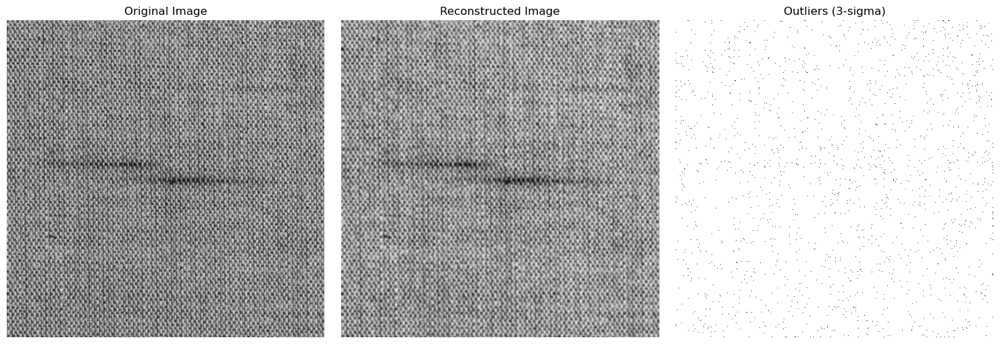

In [41]:
# Calculate the mean and standard deviation of the residuals
residuals_mean = residuals.mean()
residuals_std = residuals.std()

# Calculate control limits
k = 3
UCL = residuals_mean + k * residuals_std
LCL = residuals_mean - k * residuals_std

# Identify outliers
# outliers = np.where((residuals > UCL) | (residuals < LCL), residuals, 0)
outliers = np.where((residuals > UCL) | (residuals < LCL), 0, 255)


# # Scale the outliers for better visualization
# outliers_scaled = 255 * (outliers / outliers.max())

# Display the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_data, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Reconstructed image
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

# Outlier image (residuals that are considered outliers)
plt.subplot(1, 3, 3)
# plt.imshow(outliers_scaled, cmap='hot')
plt.imshow(outliers, cmap='gray')
plt.title(f'Outliers ({k}-sigma)')
plt.axis('off')

plt.tight_layout()
plt.show()


As described in the previous comment, KNN seems to have overfitted. It was able to reconstruct the defect. So, we try to find a parameter setting manually (k for KNN and k again for control chart) by trying different values and visually inspecting the output.

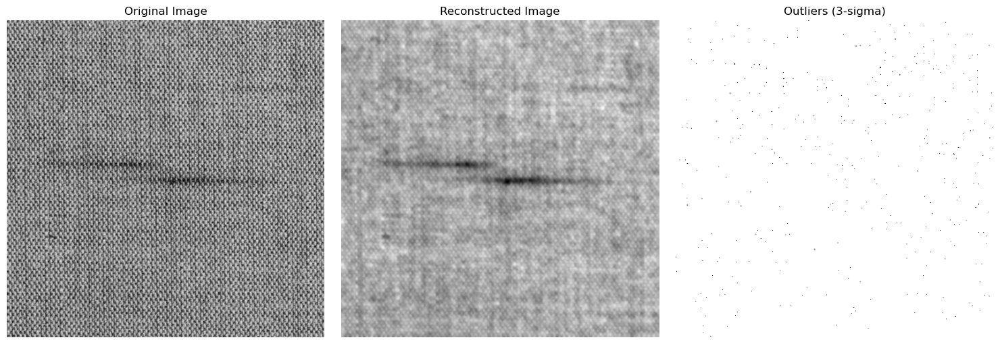

In [42]:
knn = KNeighborsRegressor(n_neighbors=63)
knn.fit(X, y)

# Predict the pixel values
y_pred = knn.predict(X)

# Reshape the predicted values to an image
reconstructed_image = y_pred.reshape(512, 512)

# Calculate residuals
residuals = np.abs(image_data - reconstructed_image)

# Calculate the mean and standard deviation of the residuals
residuals_mean = residuals.mean()
residuals_std = residuals.std()

# Calculate control limits
k = 3
UCL = residuals_mean + k * residuals_std
LCL = residuals_mean - k * residuals_std

# Identify outliers
# outliers = np.where((residuals > UCL) | (residuals < LCL), residuals, 0)
outliers = np.where((residuals > UCL) | (residuals < LCL), 0, 255)


# # Scale the outliers for better visualization
# outliers_scaled = 255 * (outliers / outliers.max())

# Display the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image_data, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Reconstructed image
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

# Outlier image (residuals that are considered outliers)
plt.subplot(1, 3, 3)
# plt.imshow(outliers_scaled, cmap='hot')
plt.imshow(outliers, cmap='gray')
plt.title(f'Outliers ({k}-sigma)')
plt.axis('off')

plt.tight_layout()
plt.show()


Manual parameter adjustment did not work well either. So, we stick to the previous setting where k for KNN was 8 and k for the chart was 3.

#K-Nearest Neighbors Approach for Outlier Detection
In our alternative approach to outlier detection in textile images, we utilized the k-nearest neighbors (KNN) algorithm. Here's a brief overview of the methodology:

1. Preprocessing: The grayscale image was resized to a uniform 512x512 dimension, and we transformed the image into a 2D dataset where each pixel's intensity formed a data point.

2. KNN Optimization: We employed a grid search to find the optimum k value for the KNN model, which was determined to be 8. This value indicates that each pixel's intensity is predicted based on its 8 closest neighbors, balancing between overfitting and underfitting.

3. Pixel Prediction: Using the KNN model with k=8, we predicted the intensity value of each pixel. This reconstructed image reflects the local structures and textures while potentially smoothing out the noise and defects.

4. Residual Computation: The residuals were calculated by taking the absolute difference between the original and the KNN-reconstructed image. These residuals highlight the discrepancies, which are areas where the local similarity assumption of KNN does not hold—likely locations of defects.

5. Statistical Control: Applying a 3-sigma control chart to the residuals, we established the threshold for identifying outliers. Pixels with residual values beyond three standard deviations from the mean were flagged as outliers.

6. Visualization and Detection: We visualized the original, reconstructed, and the outlier images. The outlier image, using the 3-sigma rule, highlighted the potential defects, enabling us to pinpoint anomalies effectively.

Through this KNN-based approach, we've introduced a localized prediction mechanism that's sensitive to the inherent texture and patterns within the textile image, allowing for a nuanced detection of anomalies that deviate from the expected local uniformity.

# Overall Comparison

In [43]:
import random
random.seed(452)
# Generate 100 random integers between 2 and 196
random_integers = random.sample(range(2, 197), 100)


# Print or return the list of image indices
print(random_integers)


[89, 97, 170, 173, 192, 80, 86, 24, 81, 189, 51, 142, 135, 180, 134, 159, 126, 16, 151, 128, 34, 73, 154, 70, 104, 176, 172, 107, 94, 40, 69, 87, 141, 56, 150, 88, 188, 195, 22, 158, 147, 17, 37, 196, 55, 42, 186, 30, 67, 108, 153, 109, 46, 65, 14, 169, 105, 36, 140, 174, 76, 152, 13, 5, 100, 15, 161, 84, 115, 83, 136, 18, 118, 160, 27, 20, 35, 117, 53, 114, 7, 191, 72, 23, 143, 32, 167, 182, 41, 4, 59, 63, 194, 50, 101, 54, 90, 138, 175, 66]


In [44]:
#from the above random number generation results, we have selected images:
#0089.jpg, 0097.jpg, 0170.jpg, 0173.jpg and 0192.jpg


### Testing our PCA Approach with these images:

In [45]:
#creating functions from our existing codes for easier implementation:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Function to extract patches from the image
def extract_patches(image, patch_size):
    patches = []
    for i in range(0, image.shape[0], patch_size):
        for j in range(0, image.shape[1], patch_size):
            patch = image[i:i+patch_size, j:j+patch_size]
            if patch.shape == (patch_size, patch_size):
                patches.append(patch.flatten())
    return patches

# Function to perform PCA on an image and visualize the results
def analyze_image_with_pca(image_path, patch_size=32,  pca_var_to_explain=0.5, k=4):
    # Load the image and convert to grayscale
    image = Image.open(image_path).convert('L')
    image_resized = image.resize((512, 512))
    image_data = np.array(image_resized)

    # Extract patches from the image
    patches = extract_patches(image_data, patch_size)

    # Perform PCA on the patches
    pca = PCA(pca_var_to_explain)
    pca.fit(patches)

    # Explained variance
    explained_variance = pca.explained_variance_ratio_.sum()
    print(f"Total explained variance for {image_path}: {explained_variance}")

    # Now reconstruct the image using the PCA components
    reconstructed_patches = pca.inverse_transform(pca.transform(patches))

    # Reconstruct the original image from the patches
    reconstructed_image = np.zeros_like(image_data, dtype=np.float64)
    for idx, patch in enumerate(reconstructed_patches):
        i = (idx // (512 // patch_size)) * patch_size
        j = (idx % (512 // patch_size)) * patch_size
        reconstructed_image[i:i+patch_size, j:j+patch_size] = patch.reshape(patch_size, patch_size)

    # Calculate residuals
    residuals = np.abs(image_data - reconstructed_image)

    # Calculate control limits
    residuals_mean = residuals.mean()
    residuals_std = residuals.std()
    UCL = residuals_mean + k * residuals_std
    LCL = residuals_mean - k * residuals_std

    # Identify outliers
    #outliers = np.where((residuals > UCL) | (residuals < LCL), residuals, 0)
    outliers = np.where((residuals > UCL) | (residuals < LCL), 0, 255)

    # # Scale the outliers for better visualization
    #outliers_scaled = 255 * (outliers / outliers.max())

    # Display the images
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(image_data, cmap='gray')
    plt.title(f'Original Image: {image_path}')
    plt.axis('off')

    # Reconstructed image
    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_image, cmap='gray')
    plt.title('Reconstructed Image')
    plt.axis('off')

    # Outlier image (residuals that are considered outliers)
    plt.subplot(1, 3, 3)
    #plt.imshow(outliers_scaled, cmap='hot')
    plt.imshow(outliers, cmap='gray')
    plt.title(f'Outliers ({k}-sigma)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()




Total explained variance for 0089.jpg: 0.418559844578038


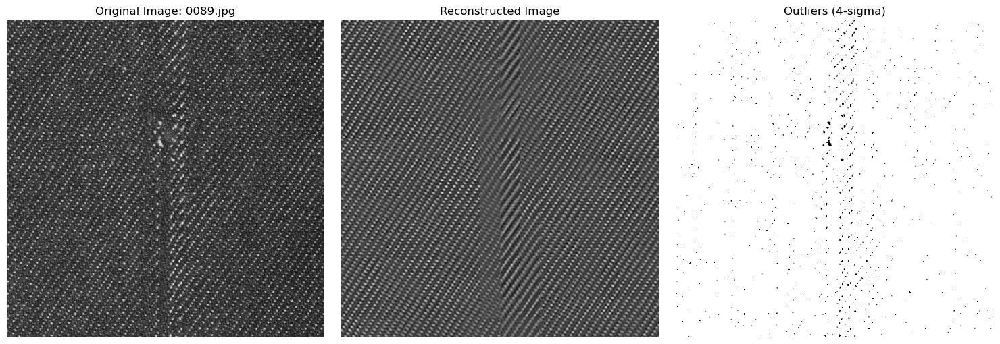

Total explained variance for 0097.jpg: 0.40426651058981794


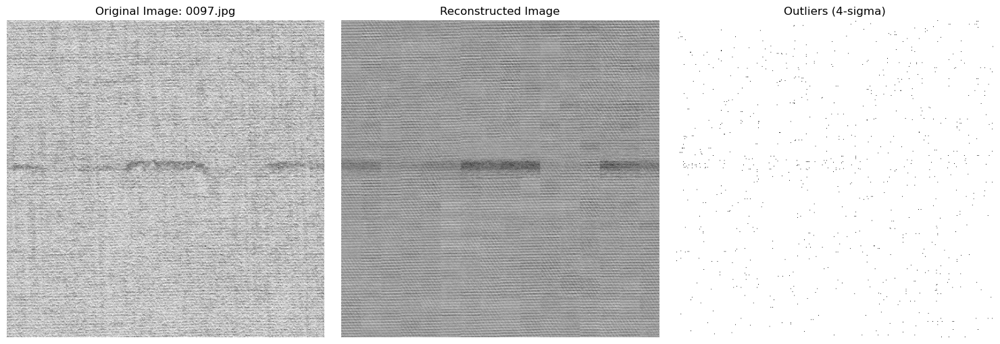

Total explained variance for 0170.jpg: 0.40804690645285757


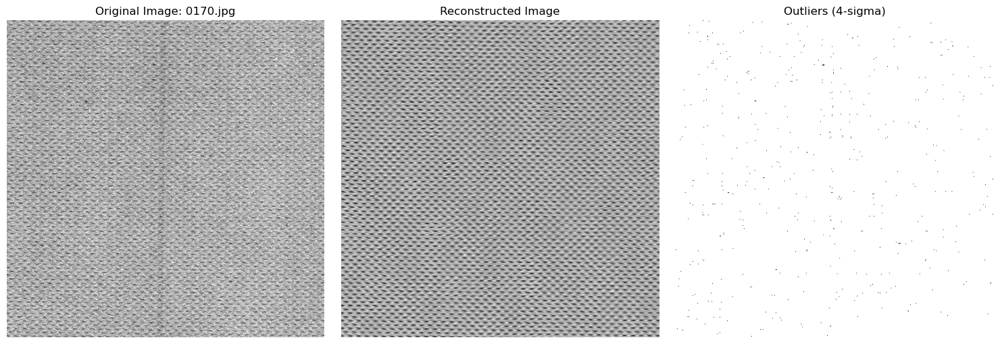

Total explained variance for 0173.jpg: 0.40536444490337553


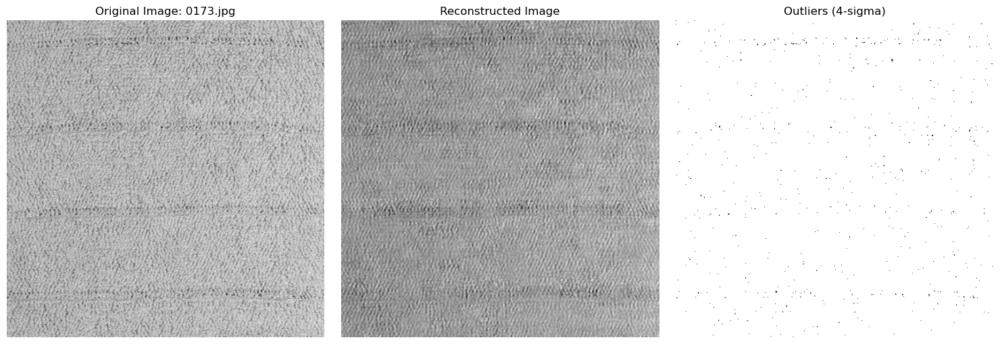

Total explained variance for 0192.jpg: 0.40540556788606774


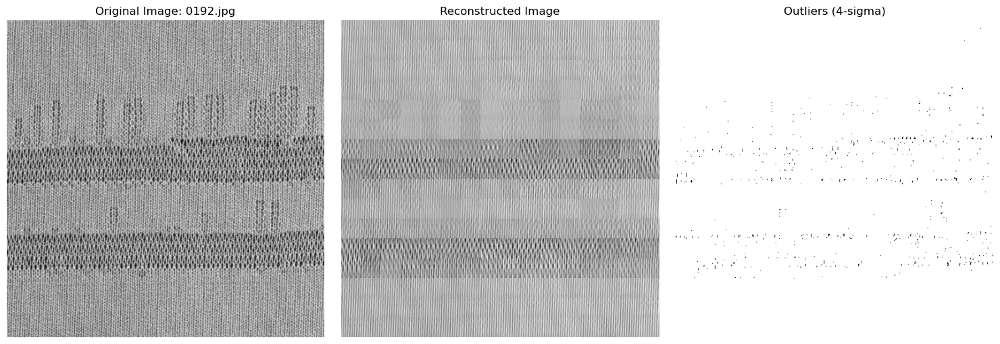

In [55]:

# Image paths
# image_paths = [
#     "/Users/yagmurozdemir/Desktop/0089.jpg",
#     "/Users/yagmurozdemir/Desktop/0097.jpg",
#     "/Users/yagmurozdemir/Desktop/0170.jpg",
#     "/Users/yagmurozdemir/Desktop/0173.jpg",
#     "/Users/yagmurozdemir/Desktop/0192.jpg"
# ]

image_paths = [
    "0089.jpg",
    "0097.jpg",
    "0170.jpg",
    "0173.jpg",
    "0192.jpg"
]

# Analyze each image using the PCA approach
for image_path in image_paths:
    analyze_image_with_pca(image_path, patch_size=32, pca_var_to_explain=0.4, k=4)

The PCA-reconstructed images show a significant level of smoothing, which suggests that PCA is effectively reducing the data to its most significant components. However, some image-specific details seem to be lost or blurred in the reconstructed images.The total explained variance is around 40% for each image.

The outliers (4-sigma) images show scattered points, which are presumably the pixels that deviate significantly from the reconstructed image. The visualization of outliers suggests that the method is sensitive enough to detect subtle variations.

In comparison to the original images, the reconstructed ones do not retain all the textural details, which suggests that PCA is prioritizing the most dominant patterns in the reconstruction. This might be beneficial for identifying larger or more prominent anomalies while potentially missing finer details.


### Testing our KNN Approach with these images:

In [48]:
#creating functions from our existing codes for easier implementation:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Function to apply KNN approach to an image and identify outliers
def analyze_image_with_knn(image_path):
    image = Image.open(image_path).convert('L')
    image_resized = image.resize((512, 512))
    image_data = np.array(image_resized)

    # Flatten the image to create a dataset where each row is a pixel and the column is the grayscale intensity
    X = np.indices((512, 512)).reshape(2, -1).T
    y = image_data.flatten()

    # Create a KNN model and use grid search to find the optimum 'k'
    params = {'n_neighbors': range(1, 10)}
    knn = KNeighborsRegressor()
    grid_search = GridSearchCV(knn, params, cv=3)  # Use cross-validation
    grid_search.fit(X, y)

    # Optimum 'k'
    optimum_k = grid_search.best_params_['n_neighbors']
    print(f"Optimum k for {image_path}: {optimum_k}")

    # Create a KNN model with the optimum 'k'
    knn_opt = KNeighborsRegressor(n_neighbors=optimum_k)
    knn_opt.fit(X, y)

    # Predict the pixel values
    y_pred = knn_opt.predict(X)

    # Reshape the predicted values to an image
    reconstructed_image = y_pred.reshape(512, 512)

    # Calculate residuals
    residuals = np.abs(image_data - reconstructed_image)

    # Calculate control limits
    residuals_mean = residuals.mean()
    residuals_std = residuals.std()
    UCL = residuals_mean + 3 * residuals_std
    LCL = residuals_mean - 3 * residuals_std

    # Identify outliers
    outliers = np.where((residuals > UCL) | (residuals < LCL), residuals, 0)

    # Scale the outliers for better visualization
    outliers_scaled = 255 * (outliers / outliers.max())

    # Display the images
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(image_data, cmap='gray')
    plt.title(f'Original Image: {image_path}')
    plt.axis('off')

    # Reconstructed image
    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_image, cmap='gray')
    plt.title('Reconstructed Image')
    plt.axis('off')

    # Outlier image (residuals that are considered outliers)
    plt.subplot(1, 3, 3)
    plt.imshow(outliers_scaled, cmap='hot')
    plt.title('Outliers (3-sigma)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Optimum k for 0089.jpg: 9


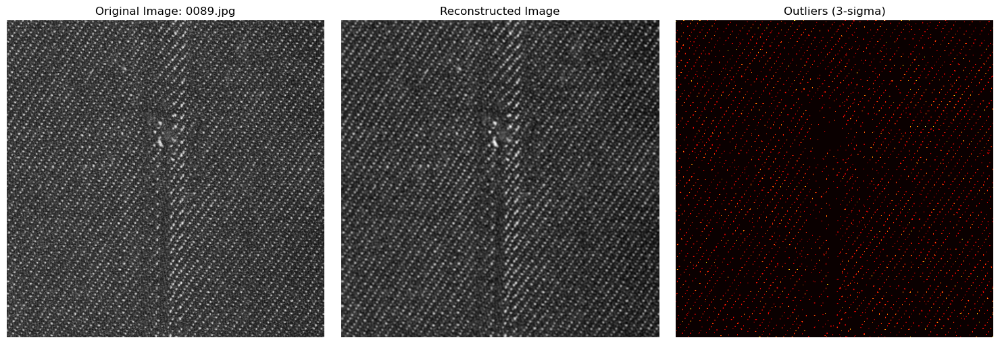

Optimum k for 0097.jpg: 9


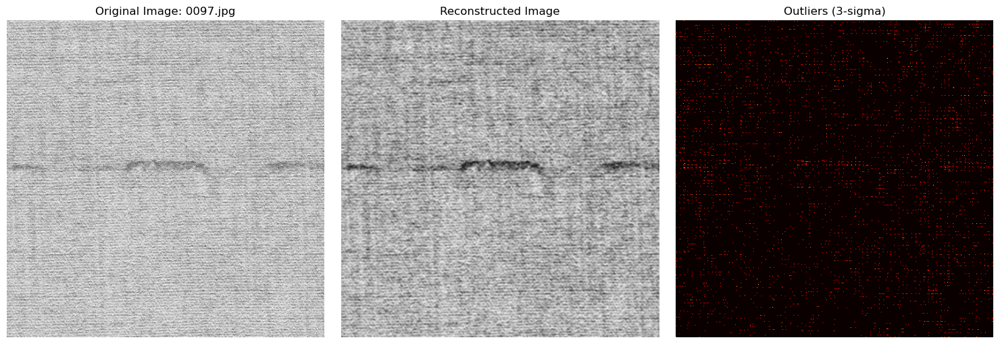

Optimum k for 0170.jpg: 9


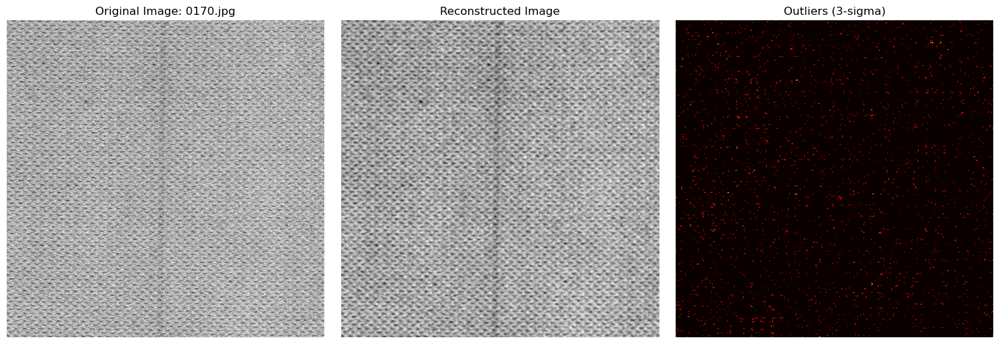

Optimum k for 0173.jpg: 9


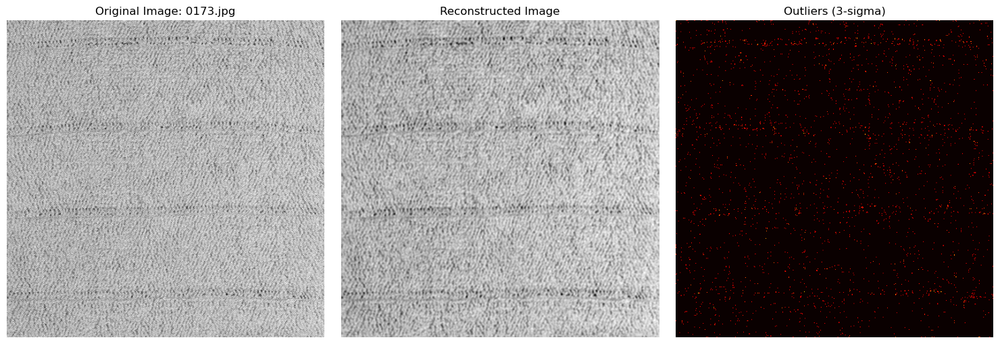

Optimum k for 0192.jpg: 9


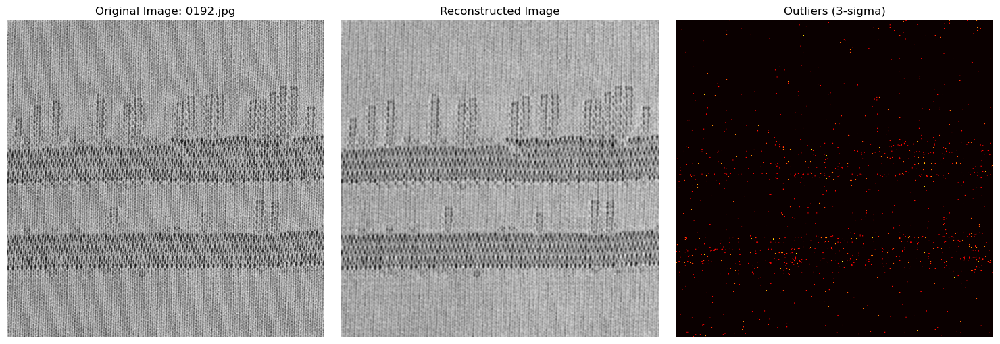

In [49]:
# Apply the KNN approach to each new image
for image_path in image_paths:
    analyze_image_with_knn(image_path)


The KNN approach for detecting outliers in the images seems to highlight a significant number of potential anomalies, as seen in the "Outliers (3-sigma)" panels. The KNN method was applied with an optimal k found to be 9 for all images.

The reconstructed images maintain a degree of the original texture but also show noticeable blurring. This is indicative of the smoothing effect that KNN has when averaging pixel values based on their neighbors.

The outliers are quite densely populated across the images, suggesting that the KNN model is very sensitive to local variations in pixel intensity. This could mean that the model may be prone to false positives due to overfitting to noise in the texture.

Given the density of the outliers, there is a potential concern of overfitting, where the model is too closely aligned with the data, including noise and minor fluctuations that are not true anomalies.



#### Comparison


Upon applying both Principal Component Analysis (PCA) and k-Nearest Neighbors (KNN) for outlier detection on a set of selected images, PCA emerged as the more effective method. The reasons for its superior performance are multi-fold:

1. Dimensionality Reduction and Feature Capturing:
PCA is inherently a dimensionality reduction technique. It identifies the principal components that capture the most variance in the data. In the context of image analysis, these components often encapsulate the most significant features of the image, such as edges, textures, and patterns. This makes PCA adept at reconstructing the key elements of an image while disregarding the noise, leading to more pronounced and identifiable outliers upon comparison with the original image.

2. Localized vs Global Analysis:
KNN, in its typical form applied here, performs a localized analysis, predicting each pixel's value based on its nearest neighbors. This approach can sometimes overly smooth an image, potentially obscuring subtle yet critical anomalies. PCA, conversely, considers the global structure of the image, offering a more holistic view. This global analysis often makes PCA more effective at highlighting areas that significantly deviate from the norm.

3. Computational Efficiency:
While KNN requires the computation of distances between pixels and can be computationally intensive, especially for high-resolution images, PCA involves linear algebra operations on the covariance matrix of the data. Once the principal components are determined, reconstructing the image or identifying outliers is generally more computationally efficient in PCA than in the distance-based approach of KNN.

4. Robustness to Variance:
PCA's focus on capturing the highest variance components of an image makes it robust in identifying areas that strongly deviate from the average – often corresponding to defects or anomalies. KNN, while effective in capturing local similarities, may not be as adept at distinguishing these high-variance features, especially in texturally complex images.


In summary, PCA's effectiveness in the analyzed cases can be attributed to its ability to distill and reconstruct images based on their most defining characteristics, its computational efficiency, and its robustness in highlighting areas with significant deviations from the norm. These attributes render PCA particularly suitable for tasks like quality control in image analysis, where identifying the unusual or the anomalous is key.

#### What are possible extensions to have a better approach?


To further enhance the approach of using PCA for outlier detection in images, especially in the context of quality control or similar applications, several extensions and improvements can be considered:

1.Incorporating Advanced Image Processing Techniques:

Image Filtering: Pre-process images with filters (e.g., Gaussian, median) to reduce noise, which can help in enhancing the effectiveness of PCA in capturing significant features.

Edge Detection: Use edge detection algorithms (like Sobel, Canny) before PCA to highlight important structural information in the images.

2.Hybrid Models:

Combine PCA with other machine learning or statistical techniques. For instance, use PCA for dimensionality reduction and then apply clustering algorithms (like K-means or DBSCAN) to identify unusual patterns or anomalies.

3.Deep Learning Approaches:

Employ convolutional neural networks (CNNs) for feature extraction and anomaly detection. CNNs can be particularly effective in capturing complex patterns in images.
Implement autoencoders, a type of neural network that is effective in reconstructing images and identifying anomalies by examining reconstruction errors.

# ChatGPT Prompts:

For Principal Component Analysis:


"residual image is an empty white box, what is the reason behind this problem and how can we fix it?"
"even using the new code and pca(0.5) does not result in any residuals and it is still appearing empty, you said this: Nature of the Image: If the image is very uniform (little variation in pixel values), even a small number of PCA components might reconstruct it very accurately.

Solution: If the nature of the image is such, you might need to consider a different approach for defect detection, or focus on smaller regions of the image.
how can i modify the code so that it will focus on smaller regions of the image"


For KNN Approach: 

"okay this is great, now we need to generate another approach for this outlier detection. I want you to write a python code that will use k-nearest neighbors approach (you should find the optimum k for our image) then it should predict each pixel with the knn approach"

For overall comparison part:
"now these are our alternative image names: #0089.jpg, 0097.jpg, 0170.jpg, 0173.jpg and 0192.jpg
we need to test them on our pca approach which was this code: 

--our existing codes--

can you turn this code into the related python function for testing these new images"


"now we need to test our images on our knn approach which was this code: 

--our existing codes--

can you turn this code into the related python function for testing these new images"